In [5]:
# 标准库
import time
from math import sqrt
import os

# 第三方库
import matplotlib.lines as mlines
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import xgboost as xgb
from IPython.display import display

#三大类别数据回归算法
from xgboost import XGBRegressor

# Scikit-learn 库
from sklearn.ensemble import AdaBoostRegressor, GradientBoostingRegressor, RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.feature_selection import RFECV
from sklearn.linear_model import BayesianRidge, ElasticNet, LinearRegression, Ridge, RidgeCV, SGDRegressor
from sklearn.metrics import explained_variance_score, mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV, cross_val_score, train_test_split
from sklearn.preprocessing import Binarizer, MinMaxScaler, StandardScaler
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor

sns.set(font='serif', style='ticks')
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['font.sans-serif']=['Arial Unicode MS']

plt.rcParams['axes.unicode_minus']=False
pd.set_option('display.max_columns',None)
from tcn import TCN
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping 
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Conv2D,MaxPooling1D, MaxPooling2D,GlobalAveragePooling1D,Flatten, Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Reshape
from tensorflow.keras.optimizers import RMSprop, Adamax
from tensorflow.keras.activations import tanh, elu
from tensorflow.keras.regularizers import l1
from tensorflow.keras.models import load_model

In [7]:
import pandas as pd

# 读取文件
data = pd.read_csv('./Vm.csv')
X = data[['PSI', 'DELTA']]
Y = data[['n', 'k']]

In [8]:
transfer1 = StandardScaler()
X = transfer1.fit_transform(X)

transfer2 = StandardScaler()
Y = transfer2.fit_transform(Y)

In [9]:
samples_per_slice = 701
n_samples = X.shape[0] // samples_per_slice
feature_slices_X = X[:n_samples * samples_per_slice].reshape((n_samples, samples_per_slice, 2))
x = np.stack(feature_slices_X, axis=0)
print(x.shape)  # (110, 701, 2)

(606, 701, 2)


In [10]:
samples_per_slice = 701
n_samples = Y.shape[0] // samples_per_slice
feature_slices_Y = Y[:n_samples * samples_per_slice].reshape((n_samples, samples_per_slice, 2))
y = np.stack(feature_slices_Y, axis=0)
print(y.shape)  # (110, 701, 2)

(606, 701, 2)


In [11]:
x_train, x_test, y_train, y_test =train_test_split(x, y, test_size=0.2, random_state=24,shuffle=True)

In [99]:
model = Sequential()

# 第一层 TCN
model.add(TCN(input_shape=(701, 2),
              nb_filters=64,
              kernel_size=3,
              dilations=[1, 2],
              use_skip_connections=True,
              return_sequences=False,
              activation=elu,
              activity_regularizer=l1(2.2800366314933075e-06)))

model.add(Flatten())

# 通过添加另一个Dense层，然后使用Reshape层调整形状为(701, 2)
model.add(Dense(701 * 2))
model.add(Reshape((701, 2)))

# 输出模型结构
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 tcn_4 (TCN)                 (None, 64)                37696     
                                                                 
 flatten_4 (Flatten)         (None, 64)                0         
                                                                 
 dense_4 (Dense)             (None, 1402)              91130     
                                                                 
 reshape_4 (Reshape)         (None, 701, 2)            0         
                                                                 
Total params: 128826 (503.23 KB)
Trainable params: 128826 (503.23 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [100]:
callbacks = [EarlyStopping(monitor='val_loss', patience=27, verbose=1, min_delta=0.00001)]

In [101]:
# 编译模型，使用MSE损失函数和SGD优化器
model.compile(loss='mean_squared_error', optimizer=Adamax(learning_rate=0.002243759419927125))

# 训练模型，假设训练数据为X_train和y_train
history = model.fit(x_train, y_train, callbacks=callbacks,epochs=1000, batch_size=64, validation_split=0.2208789359100805)

Epoch 1/1000
6/6 [==============================] - 3s 291ms/step - loss: 0.8957 - val_loss: 0.6474
Epoch 2/1000
6/6 [==============================] - 1s 178ms/step - loss: 0.5494 - val_loss: 0.3995
Epoch 3/1000
6/6 [==============================] - 2s 295ms/step - loss: 0.3698 - val_loss: 0.3085
Epoch 4/1000
6/6 [==============================] - 2s 266ms/step - loss: 0.2947 - val_loss: 0.2558
Epoch 5/1000
6/6 [==============================] - 1s 220ms/step - loss: 0.2462 - val_loss: 0.2211
Epoch 6/1000
6/6 [==============================] - 1s 208ms/step - loss: 0.2150 - val_loss: 0.1982
Epoch 7/1000
6/6 [==============================] - 1s 185ms/step - loss: 0.1898 - val_loss: 0.1735
Epoch 8/1000
6/6 [==============================] - 1s 201ms/step - loss: 0.1677 - val_loss: 0.1548
Epoch 9/1000
6/6 [==============================] - 1s 227ms/step - loss: 0.1501 - val_loss: 0.1411
Epoch 10/1000
6/6 [==============================] - 1s 197ms/step - loss: 0.1392 - val_loss: 0.1353

In [102]:
# #绘制训练集和验证集的损失曲线
# plt.plot(history.history['loss'], label='Training Loss')
# plt.plot(history.history['val_loss'], label='Validation Loss')
# plt.title('Model Loss')
# plt.ylabel('Loss')
# plt.xlabel('Epoch')
# plt.legend()
# plt.show()

In [12]:
y_pred = model.predict(x_test)
y_pred_reshaped = y_pred.reshape(-1, 2)
print(y_pred_reshaped.shape)

y_test_reshaped = y_test.reshape(-1, 2)
print(y_test_reshaped.shape)

4/4 [==============================] - 0s 43ms/step
(85522, 2)
(85522, 2)


In [13]:
# 通过inverse_transform方法将标准化后的输出还原为原始值
y_pred_reshaped = transfer2.inverse_transform(y_pred_reshaped)

# 同样，如果想要还原测试集中的真实值
y_test_reshaped = transfer2.inverse_transform(y_test_reshaped)

In [14]:
# 提取前701个的第一列和第二列
n_pred = y_pred_reshaped[:, 0]
n_test = y_test_reshaped[:, 0]
k_pred = y_pred_reshaped[:, 1]
k_test = y_test_reshaped[:, 1]

# 打印形状
print(n_pred.shape)  # 输出(122, 701)
print(n_test.shape)  # 输出(122, 701)
print(k_pred.shape)  # 输出(122, 701)
print(k_test.shape)  # 输出(122, 701)

(85522,)
(85522,)
(85522,)
(85522,)


In [15]:
k_pred[k_pred < 0] = 0

In [16]:
mse = mean_squared_error(n_test, n_pred)
print("n_test MSE: ", mse)
rmse = np.sqrt(mse)
print("n_test RMSE: ", rmse)
mae = mean_absolute_error(n_test, n_pred)
print("n_test MAE: ", mae)
r2 = r2_score(n_test, n_pred)
print("n_test R2 score: ", r2)

n_test MSE:  0.009863421879023315
n_test RMSE:  0.09931476163704625
n_test MAE:  0.07297643211403206
n_test R2 score:  0.855123949297859


In [17]:
mse = mean_squared_error(k_test, k_pred)
print("k_test MSE: ", mse)
rmse = np.sqrt(mse)
print("k_test RMSE: ", rmse)
mae = mean_absolute_error(k_test, k_pred)
print("k_test MAE: ", mae)
r2 = r2_score(k_test, k_pred)
print("k_test R2 score: ", r2)

k_test MSE:  0.0026133200772690737
k_test RMSE:  0.05112064237926861
k_test MAE:  0.02401504102928931
k_test R2 score:  0.9835067817247003


In [18]:
samples_per_slice = 701
n_samples = n_pred.shape[0] // samples_per_slice
feature_slices_pred = n_pred[:n_samples * samples_per_slice].reshape((n_samples, samples_per_slice, 1))
n_pred = np.stack(feature_slices_pred, axis=0)
print(n_pred.shape) 

samples_per_slice = 701
n_samples = n_test.shape[0] // samples_per_slice
feature_slices_test = n_test[:n_samples * samples_per_slice].reshape((n_samples, samples_per_slice, 1))
n_test = np.stack(feature_slices_test, axis=0)
print(n_test.shape)

samples_per_slice = 701
n_samples = k_pred.shape[0] // samples_per_slice
feature_slices_pred = k_pred[:n_samples * samples_per_slice].reshape((n_samples, samples_per_slice, 1))
k_pred = np.stack(feature_slices_pred, axis=0)
print(k_pred.shape) 

samples_per_slice = 701
n_samples = k_test.shape[0] // samples_per_slice
feature_slices_test = k_test[:n_samples * samples_per_slice].reshape((n_samples, samples_per_slice, 1))
k_test = np.stack(feature_slices_test, axis=0)
print(k_test.shape)

(122, 701, 1)
(122, 701, 1)
(122, 701, 1)
(122, 701, 1)


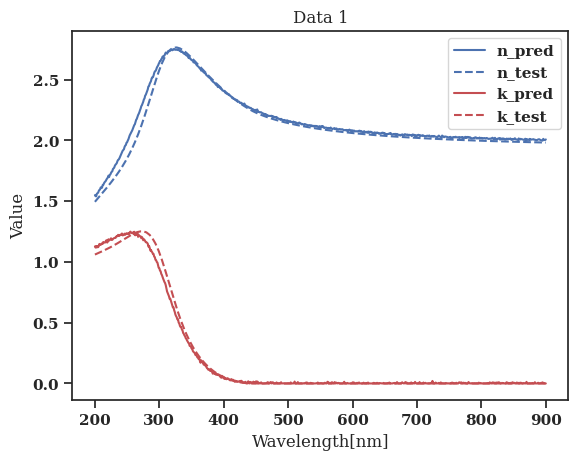

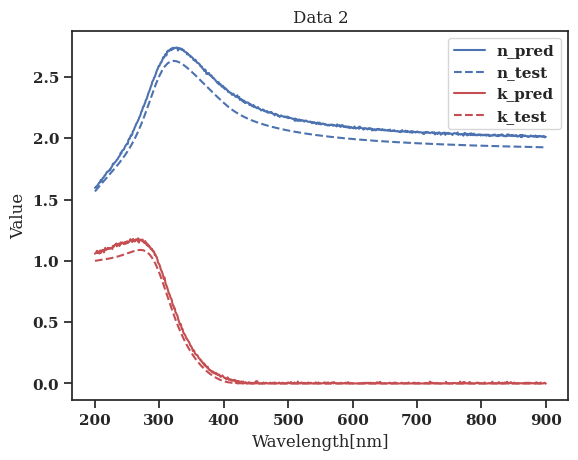

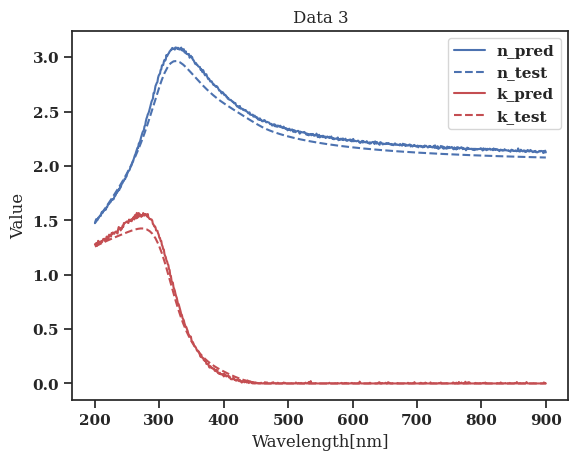

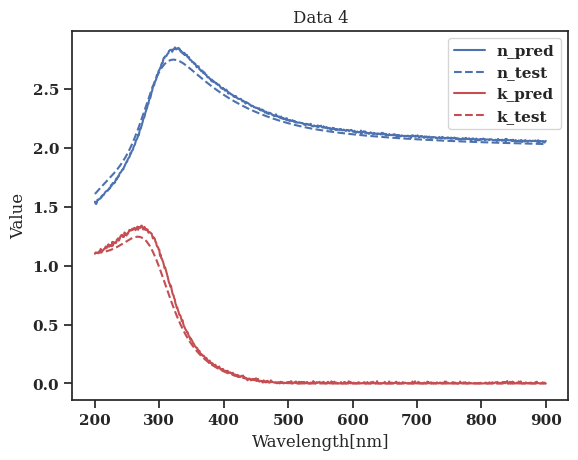

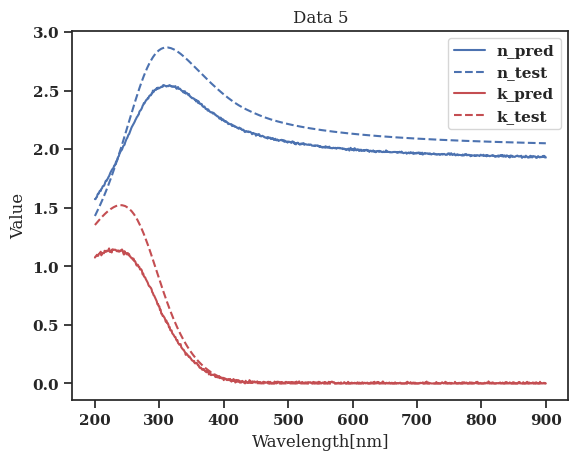

...

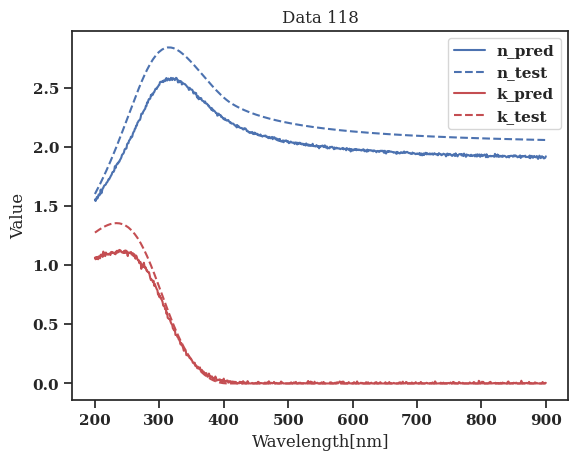

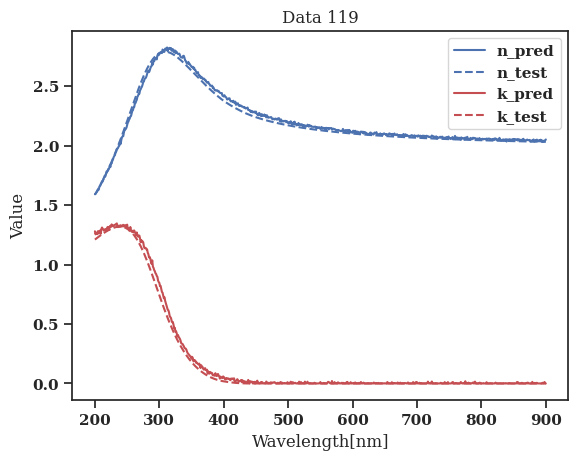

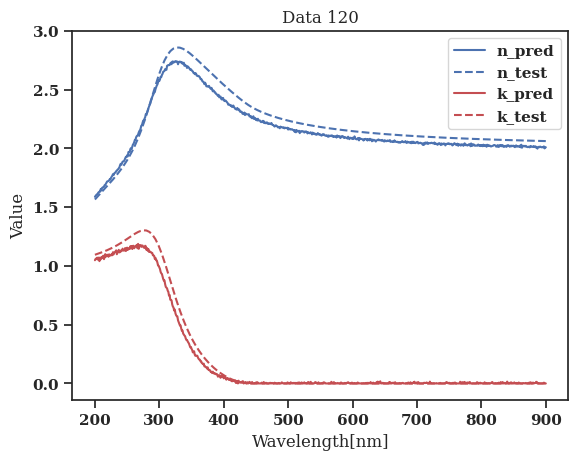

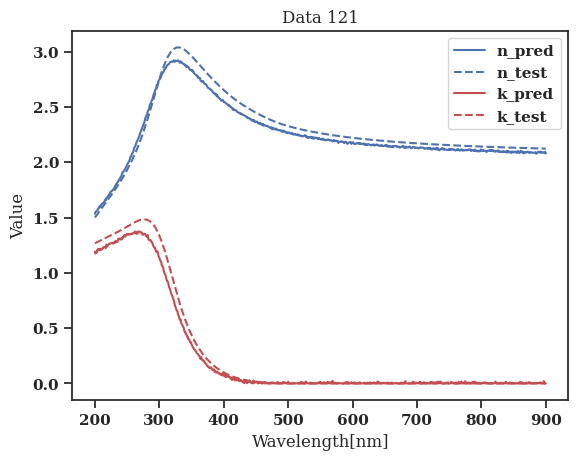

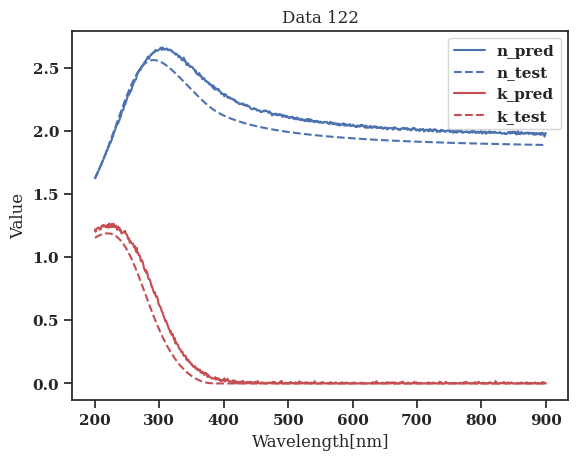

In [19]:
# 生成x坐标轴数据
wavelength = range(200, 901)

# 遍历121个数据，分别绘制四条曲线
for i in range(122):
    plt.figure()
    plt.plot(wavelength, n_pred[i], 'b-', label='n_pred')
    plt.plot(wavelength, n_test[i], 'b--', label='n_test')
    plt.plot(wavelength, k_pred[i], 'r-', label='k_pred')
    plt.plot(wavelength, k_test[i], 'r--', label='k_test')
    
    plt.xlabel('Wavelength[nm]')
    plt.ylabel('Value')
    plt.title('Data {}'.format(i+1))
    plt.legend()
    plt.show()

In [20]:
# 提取第26个元素
n_pred_26 = n_pred[25, :, 0]  # 第一个索引是25，因为Python的索引是从0开始的
n_test_26 = n_test[25, :, 0]
k_pred_26 = k_pred[25, :, 0]
k_test_26 = k_test[25, :, 0]

# 创建一个DataFrame
df = pd.DataFrame({
    'n_pred': n_pred_26,
    'n_test': n_test_26,
    'k_pred': k_pred_26,
    'k_test': k_test_26
})

# 保存为CSV文件
df.to_csv('TCNdata.csv', index=False)

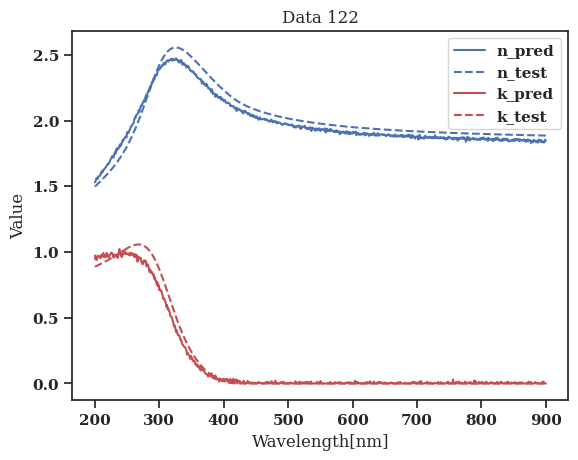

In [21]:
# 生成x坐标轴数据
wavelength = range(200, 901)

# 遍历121个数据，分别绘制四条曲线
plt.figure()
plt.plot(wavelength, n_pred_26, 'b-', label='n_pred')
plt.plot(wavelength, n_test_26, 'b--', label='n_test')
plt.plot(wavelength, k_pred_26, 'r-', label='k_pred')
plt.plot(wavelength, k_test_26, 'r--', label='k_test')
    
plt.xlabel('Wavelength[nm]')
plt.ylabel('Value')
plt.title('Data {}'.format(i+1))
plt.legend()
plt.show()

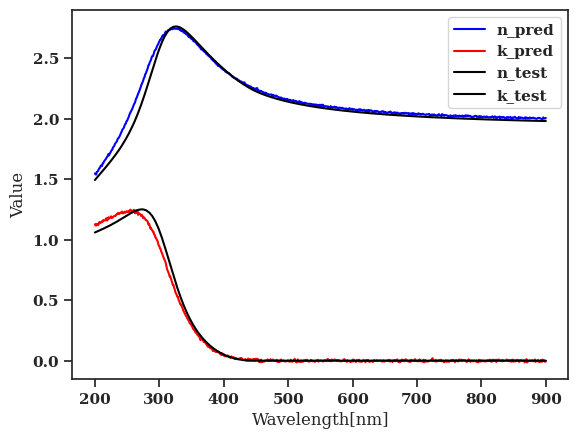

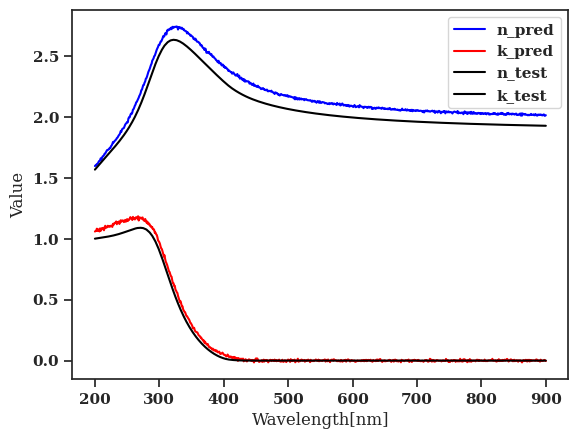

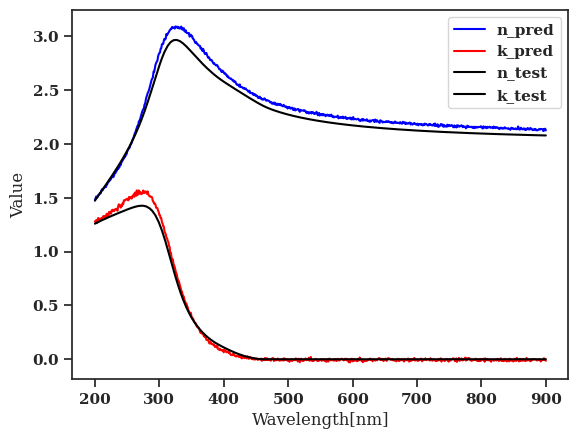

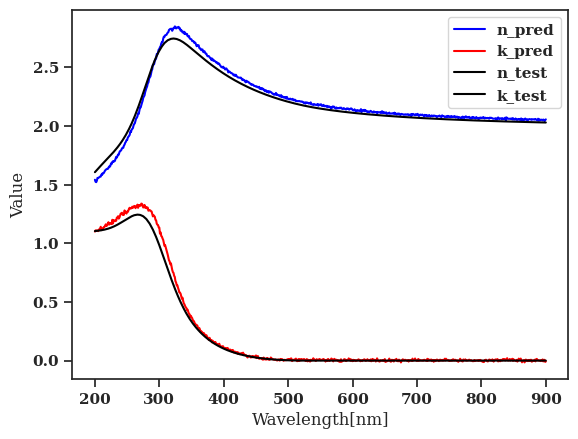

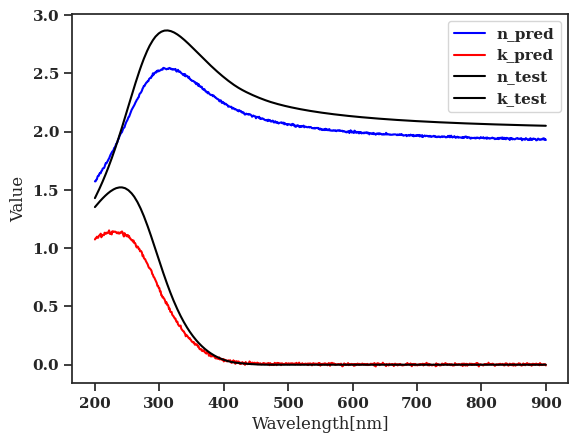

...

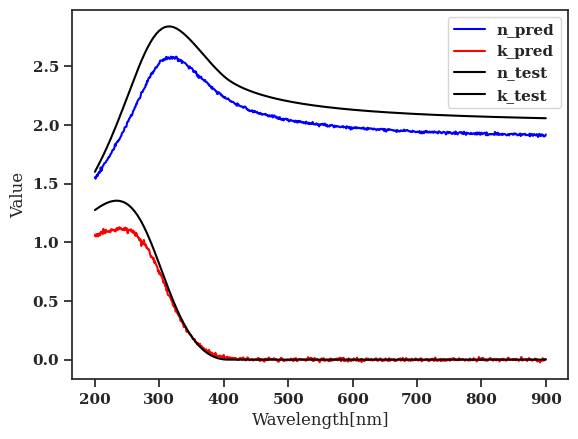

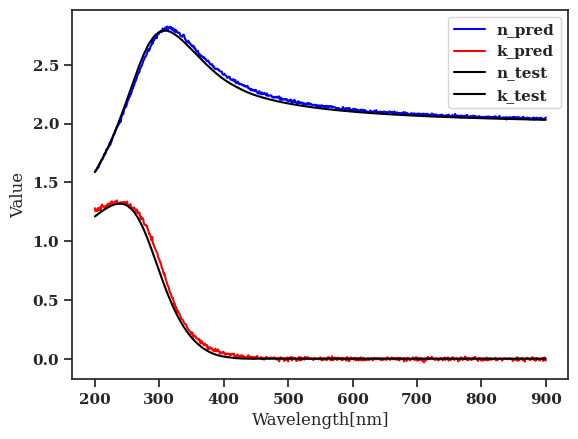

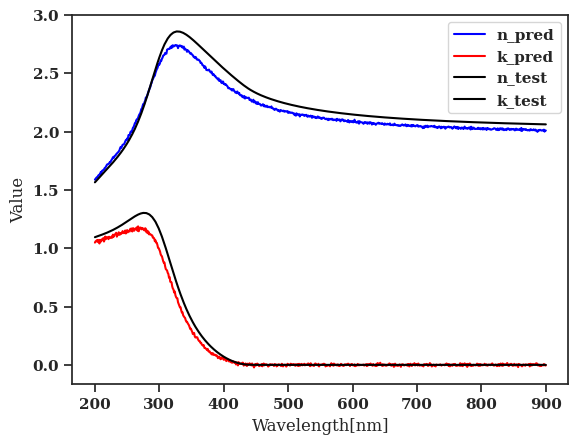

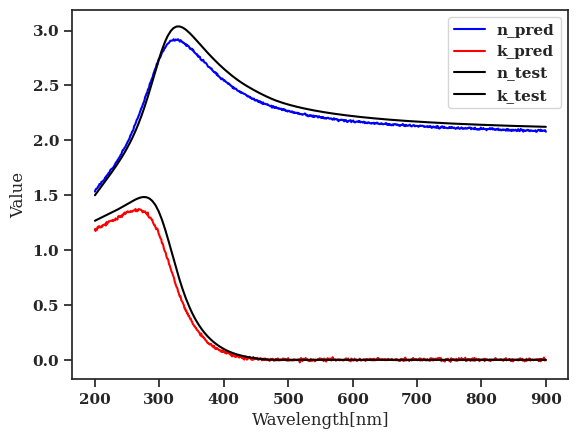

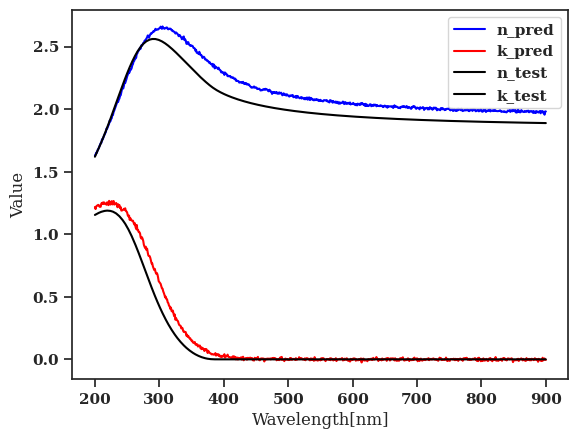

In [26]:
# for sample_index in range(y_pred.shape[0]):
#     y_pred_sample = y_pred[sample_index]
#     y_test_sample = y_test[sample_index]

#     x = range(200, 200 + y_pred_sample.shape[0])  # 修改 x 轴的值，从200开始计数

#     plt.plot(x, y_pred_sample[:, 0], label='n_pred', color='blue')
#     plt.plot(x, y_pred_sample[:, 1], label='k_pred', color='red')
#     plt.plot(x, y_test_sample[:, 0], label='n_test', color='black')
#     plt.plot(x, y_test_sample[:, 1], label='k_test', color='black')
#     plt.xlabel('Wavelength[nm]')
#     plt.ylabel('Value')
#     plt.legend(loc='upper right')
#     plt.show()

In [25]:
# y_pred_2 = np.reshape(y_pred, (-1, 2))
# y_test_2 = np.reshape(y_test, (-1, 2))
# mse = mean_squared_error(y_test_2, y_pred_2)
# print("Test MSE: ", mse)
# rmse = np.sqrt(mse)
# print("Test RMSE: ", rmse)
# mae = mean_absolute_error(y_test_2, y_pred_2)
# print("Test MAE: ", mae)
# r2 = r2_score(y_test_2, y_pred_2)
# print("Test R2 score: ", r2)

Test MSE:  0.006253160329591438
Test RMSE:  0.07907692665747347
Test MAE:  0.04945661589136376
Test R2 score:  0.9192220264869065


In [110]:
# model.save('tcnnk_model.keras')  # SavedModel格式，明确指定扩展名

In [6]:
from tensorflow.keras.models import load_model
model = load_model('tcnnk_model.keras', custom_objects={'TCN': TCN})